# init

In [4]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams["font.size"] = 30  # フォントサイズ

# sample from web

https://stackoverflow.com/questions/40670031/coupled-map-lattice-in-python
ここのコード参照
みたことないよくわからんが分岐図(bifurcation diagram)ではある。
大事なのはなんのモデルかと言う一点であり、それは自分で例を探せばいいのでは？？

[0.41540519 0.24047398 0.15816469 0.25350469 0.41984345 0.43449867
 0.71006568 0.51712792 0.42870657 0.52995541 0.31644985 0.4466613
 0.76181303 0.31748257 0.68191025 0.18019222 0.49822883 0.56425268
 0.56133966 0.26563127 0.3369226  0.81789007 0.28584537 0.66357685
 0.42719508 0.79654445 0.51837552 0.43730569 0.43726169 0.35705685
 0.71570311 0.8792069  0.37692738 0.21379815 0.79612923 0.74641772
 0.18231615 0.69134036 0.33957181 0.73916596 0.39930347 0.27265996
 0.37776391 0.87741532 0.45159709 0.27096    0.75265191 0.31467988
 0.31325074 0.39212999 0.87587281 0.46478736 0.22533366 0.19444662
 0.63118935 0.45344119 0.35231143 0.50940614 0.64206125 0.52845545]
(60, 4000)
(4000, 100)


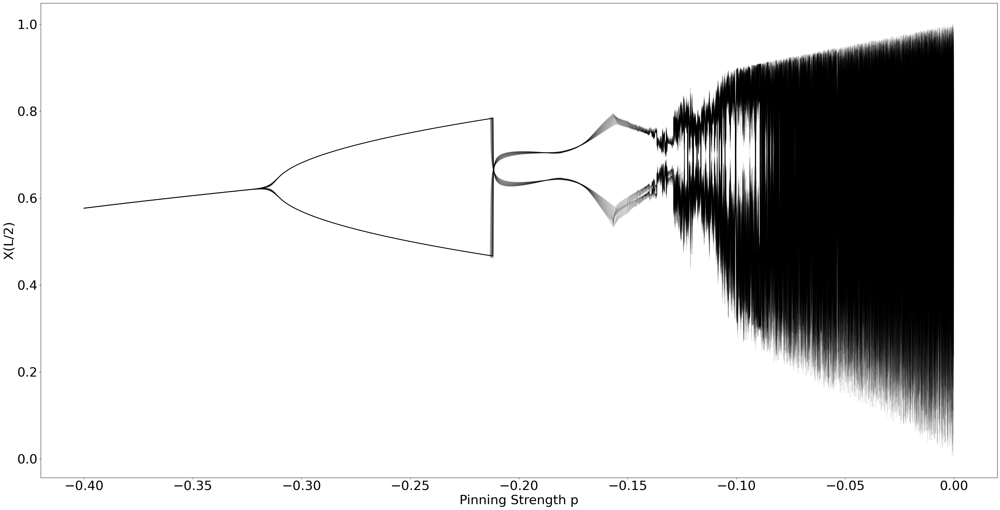

In [5]:
L = 60      # no. of lattice sites
eps = 0.6   # diffusive coupling strength: 
r = 4.0     # control parameter r:

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
print(ic)

nTransients = 100   # The iterates we'll throw away
nIterates = 100     # This sets how much the attractor is filled in
nSteps = 4000       # This sets how dense the bifurcation diagram will be

pLow = -0.4
pHigh = 0.0
pInc = (pHigh - pLow) / nSteps

def func1(r, x):
  return r*x*(1-x)

def LM(f, p, x):
    x_new = np.empty(x.shape)
    for i in range(L):
        if i == 0:
            x_new[i] = ((1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[L-1]) + f(r,x[i+1])) + p)
        elif i == L - 1:
            x_new[i] = ((1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + f(r,x[0])) + p)
        elif i > 0 and i < L - 1:
            x_new[i] = ((1 - eps) * f(r,x[i]) + 0.5 * eps * ( f(r,x[i-1])  + f(r,x[i+1])) + p)
    return x_new

p = np.arange(pLow, pHigh, pInc)
"""
np.arange;
https://qiita.com/supersaiakujin/items/4410efe5dc81982ef208

np.tile;
https://qiita.com/supersaiakujin/items/e4085b410da0c16f09ed

np.newaxis; とてもつもなくめっちゃ間違えてるけど参考になる. exercise_pythonを見よう.
https://qiita.com/rtok/items/10f803a226892a760d75


"""
state = np.tile(ic[:, np.newaxis], (1, p.size))

# set initial conditions
# throw away the transient iterations
for i in range(nTransients):
    state = LM(func1, p, state)

# now store the next batch of iterates
x = np.empty((p.size, nIterates))           # store iterates
for i in range(nIterates):
    state = LM(func1, p, state)
    x[:, i] = state[L // 2 - 1]
print(state.shape)
print(x.shape)
# Plot the list of (r,x) pairs as pixels
plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
plt.plot(p, x, c=(0, 0, 0, 0.1))
plt.xlabel('Pinning Strength p')
plt.ylabel('X(L/2)')

# Display plot in window
plt.show()

# CML

## series1

In [10]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt

L = 50      # no. of lattice sites
eps = 0.2   # diffusive coupling strength: 
r = 3.2   # control parameter r:

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
#print(ic)

nTransients = 100   # The iterates we'll throw away
nIterates = 100     # This sets how much the attractor is filled in
nSteps = 4000       # This sets how dense the bifurcation diagram will be

"""
端同士を結合した場合:
端同士を結合させる(循環)と収束しない？
"""

def next_x(l, x):
    x_new = np.empty(x.shape)
    for i in range(l):
        if i == 0:
            x_new[i] = ((1 - eps) * (r * x[i] * (1 - x[i])) + 0.5 * eps * (r * x[L - 1] * (1 - x[L - 1]) + r * x[i + 1] * (1 - x[i + 1])) )
        elif i == l - 1:
            x_new[i] = ((1 - eps) * (r * x[i] * (1 - x[i])) + 0.5 * eps * (r * x[i - 1] * (1 - x[i - 1]) + r * x[0] * (1 - x[0])) )
        elif i > 0 and i < l - 1:
            x_new[i] = ((1 - eps) * (r * x[i] * (1 - x[i])) + 0.5 * eps * (r * x[i - 1] * (1 - x[i - 1]) + r * x[i + 1] * (1 - x[i + 1])) )
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(L, states[i])
print(states.shape)

(4000, 50)


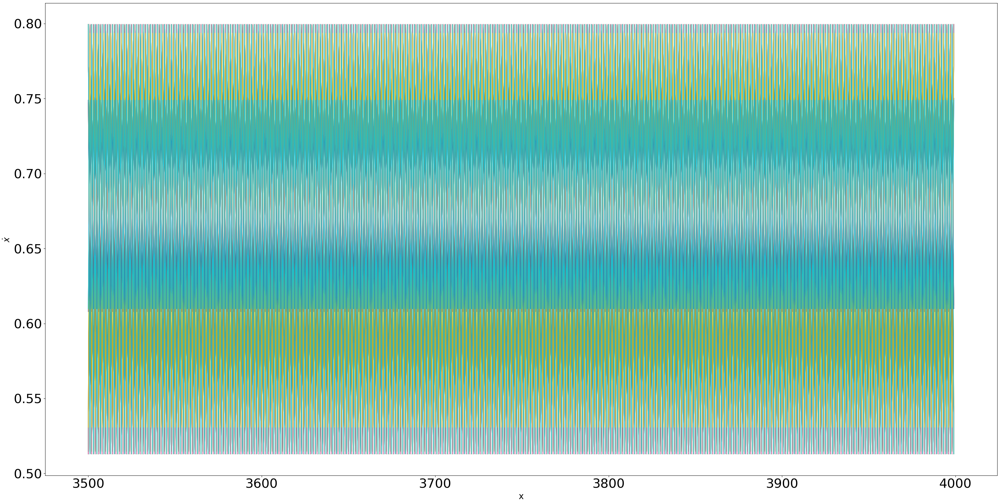

In [12]:

plot_len=500
plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(1,1)
ax1.set_xlabel("x",fontsize=20)
ax1.set_ylabel("$\dot{x}$",fontsize=20)  

time=np.arange(nSteps)[-plot_len:]
plt.plot(time, states[-plot_len:])

# Display plot in window
plt.show()

## series2

In [13]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt

L = 50      # no. of lattice sites
eps = 0.3   # diffusive coupling strength: 
r = 2.7     # control parameter r:

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
#print(ic)

nTransients = 0   # The iterates we'll throw away
nSteps = 4000       # This sets how dense the bifurcation diagram will be

"""
端を0の固定端とする。
"""

def next_x(l, x):
    x_new = np.empty(x.shape)
    for i in range(l):
        if i == 0:
            x_new[i] = ((1 - eps) * (r * x[i] * (1 - x[i])) + 0.5 * eps * (0*r * x[L - 1] * (1 - x[L - 1]) + r * x[i + 1] * (1 - x[i + 1])) )
        elif i == l - 1:
            x_new[i] = ((1 - eps) * (r * x[i] * (1 - x[i])) + 0.5 * eps * (r * x[i - 1] * (1 - x[i - 1]) + 0*r * x[0] * (1 - x[0])) )
        elif i > 0 and i < l - 1:
            x_new[i] = ((1 - eps) * (r * x[i] * (1 - x[i])) + 0.5 * eps * (r * x[i - 1] * (1 - x[i - 1]) + r * x[i + 1] * (1 - x[i + 1])) )
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(L, states[i])

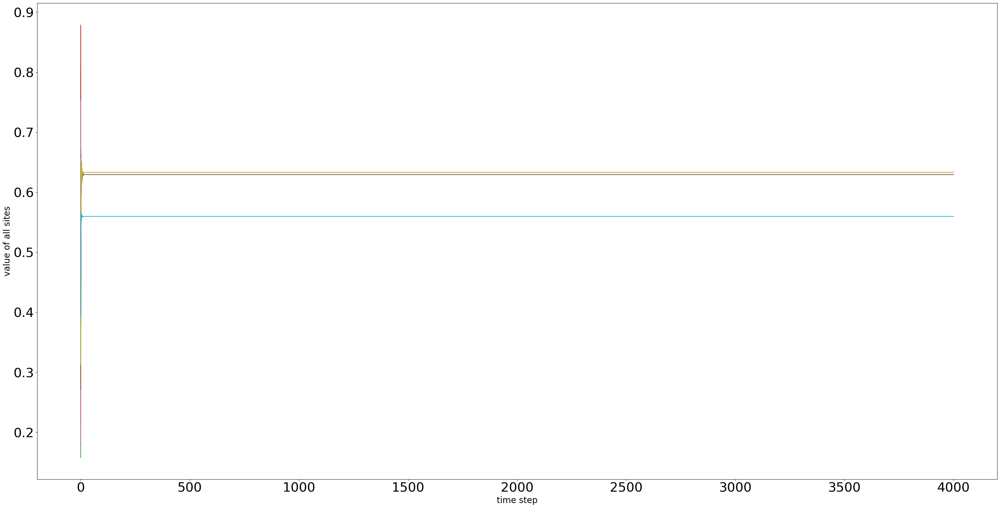

In [14]:
plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(1,1)
ax1.set_xlabel("time step",fontsize=20)
ax1.set_ylabel("value of all sites",fontsize=20)  

time=np.arange(nSteps)
plt.plot(time, states)

# Display plot in window
plt.show()

## turbulence 乱流

### normal organized 周期的 参考

In [15]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt

"""
欠陥乱流, 非線形を大きくすると欠陥は自発的に生成される.またはペア消滅. p89
L = 128      # no. of lattice sites
eps = 0.1   # diffusive coupling strength: 
r = 1.895     # control parameter r:
"""

#ドメイン(空間的に近接する領域のこと?)構造がよくわかるやつ.p85
L = 200      # no. of lattice sites
eps = 0.4   # diffusive coupling strength: 
r = 1.42     # control parameter r:


np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
#print(ic)

nTransients = 10000   # The iterates we'll throw away
nSteps = 250       # This sets how dense the bifurcation diagram will be

"""
端を0の固定端とする。
"""
def func1(r, x):
  return r*x*(1-x)

def logistic(a, x):
  return 1-(a*x)*x

def next_x(f, l, x):
    x_new = np.empty(x.shape)
    for i in range(L):
        if i == 0:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (0*f(r,x[L-1]) + f(r,x[i+1]))
        elif i == L - 1:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + 0*f(r,x[0]))
        elif i > 0 and i < L - 1:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + f(r,x[i+1]))
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

"""func1
for i in range(nTransients):
  ic=next_x(func1, L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(func1, L, states[i])

"""

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])

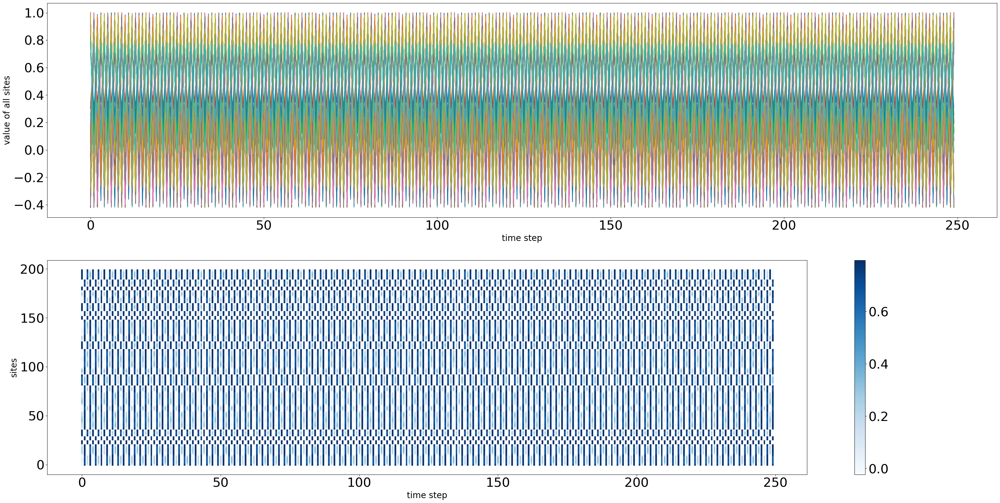

In [16]:

plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(2,1)
ax1[0].set_xlabel("time step",fontsize=20)
ax1[0].set_ylabel("value of all sites",fontsize=20)  

time=np.arange(nSteps)
ax1[0].plot(time, states)

ax1[1].set_xlabel("time step",fontsize=20)
ax1[1].set_ylabel("sites",fontsize=20)  

for i in range(L):
  bar=ax1[1].scatter(time, np.tile(i, time.size), s=8, c=states[:,i], cmap='Blues', marker=",")

# Display plot in window
fig.colorbar(bar)
plt.show()

### defect 欠陥のある

In [17]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt

#欠陥乱流, 非線形を大きくすると欠陥は自発的に生成される.またはペア消滅. p89
L = 128      # no. of lattice sites
eps = 0.1   # diffusive coupling strength: 
r = 1.895     # control parameter r:

"""
#ドメイン(空間的に近接する領域のこと?)構造がよくわかるやつ.p85
L = 200      # no. of lattice sites
eps = 0.4   # diffusive coupling strength: 
r = 1.42     # control parameter r:
"""

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
#print(ic)

nTransients = 10000   # The iterates we'll throw away
nSteps = 250       # This sets how dense the bifurcation diagram will be

"""
端を0の固定端とする。
"""
def func1(r, x):
  return r*x*(1-x)

def logistic(a, x):
  return 1-(a*x)*x

def next_x(f, l, x):
    x_new = np.empty(x.shape)
    for i in range(L):
        if i == 0:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (0*f(r,x[L-1]) + f(r,x[i+1]))
        elif i == L - 1:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + 0*f(r,x[0]))
        elif i > 0 and i < L - 1:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + f(r,x[i+1]))
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

"""func1
for i in range(nTransients):
  ic=next_x(func1, L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(func1, L, states[i])

"""

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])

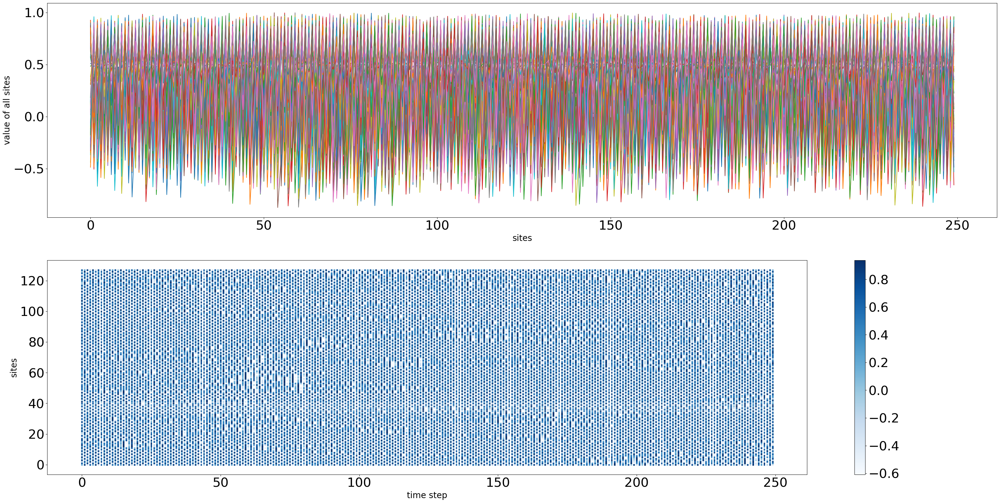

In [18]:
plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(2,1)
ax1[0].set_xlabel("sites",fontsize=20)
ax1[0].set_ylabel("value of all sites",fontsize=20)  

time=np.arange(nSteps)
ax1[0].plot(time, states)

ax1[1].set_xlabel("time step",fontsize=20)
ax1[1].set_ylabel("sites",fontsize=20)  
for i in range(L):
  bar=ax1[1].scatter(time, np.tile(i, time.size), s=8, c=states[:,i], cmap='Blues', marker=",")

# Display plot in window
fig.colorbar(bar)
plt.show()

## domain architecture

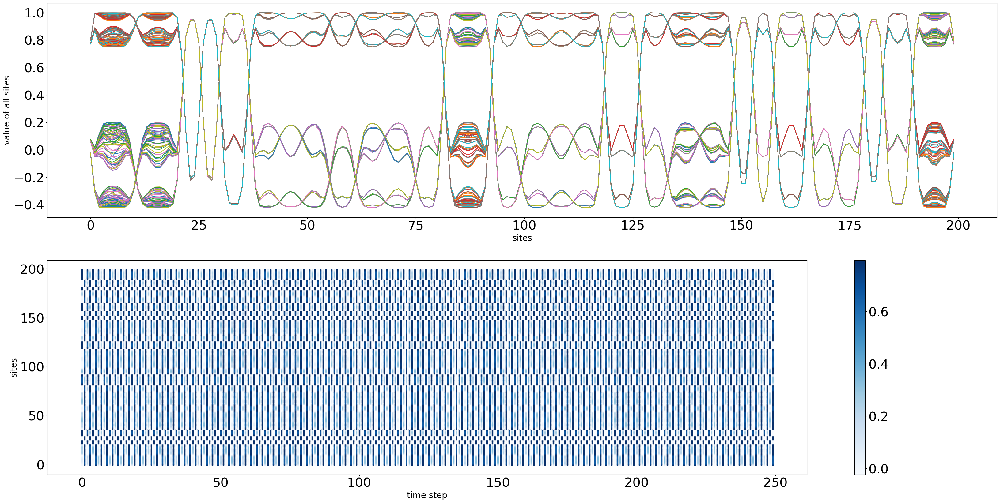

In [19]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt

#ドメイン(空間的に近接する領域のこと?)構造がよくわかるやつ.p85
L = 200      # no. of lattice sites
eps = 0.4   # diffusive coupling strength: 
r = 1.42     # control parameter r:

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
#print(ic)

nTransients = 10000   # The iterates we'll throw away
nSteps = 250       # This sets how dense the bifurcation diagram will be

pLow = -0.4
pHigh = 0.0
pInc = (pHigh - pLow) / nSteps


"""
端を0の固定端とする。
"""
def func1(r, x):
  return r*x*(1-x)

def logistic(a, x):
  return 1-(a*x)*x

def next_x(f, l, x):
    x_new = np.empty(x.shape)
    for i in range(L):
        if i == 0:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (0*f(r,x[L-1]) + f(r,x[i+1]))
        elif i == L - 1:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + 0*f(r,x[0]))
        elif i > 0 and i < L - 1:
            x_new[i] = (1 - eps) * f(r,x[i]) + 0.5 * eps * (f(r,x[i-1]) + f(r,x[i+1]))
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])

plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(2,1)
ax1[0].set_xlabel("sites",fontsize=20)
ax1[0].set_ylabel("value of all sites",fontsize=20)  

time=np.arange(nSteps)
for i in range(nSteps): #一気に全部プロットした際の系列指定の方法はわからなかった. for文で強引に推測させる.
  ax1[0].plot(np.arange(L), states[i], linestyle = "solid")

ax1[1].set_xlabel("time step",fontsize=20)
ax1[1].set_ylabel("sites",fontsize=20)  

for i in range(L): 
  bar=ax1[1].scatter(time, np.tile(i, time.size), s=8, c=states[:,i], cmap='Blues', marker=",")

# Display plot in window
fig.colorbar(bar)
plt.show()

# GCM

## series

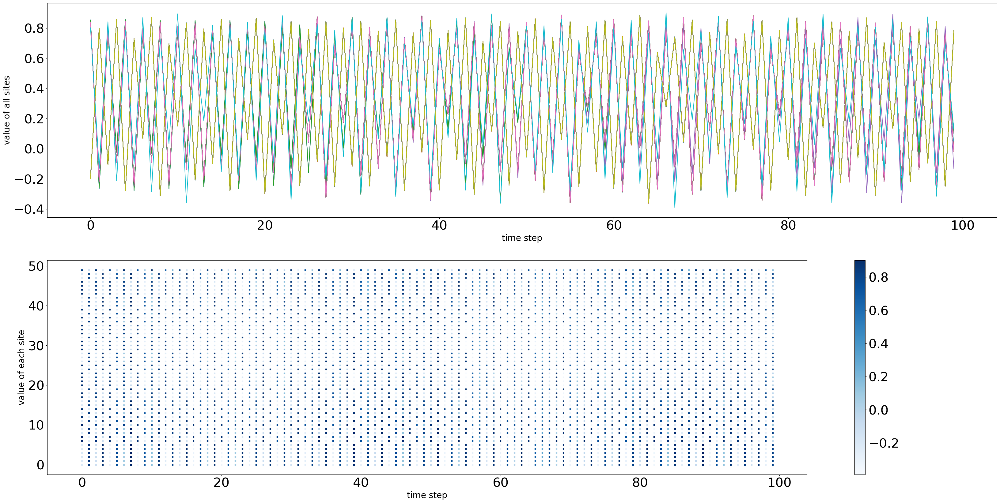

In [20]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt

L = 50      # no. of lattice sites
eps = 0.2   # diffusive coupling strength: 
r = 1.92     # control parameter r:

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)
#print(ic)

nTransients = 1000   # The iterates we'll throw away
nSteps = 100       # This sets how dense the bifurcation diagram will be


def logistic(a, x):
  return 1.0-(a*x)*x

def next_x(f, N, x):
    x_new = np.empty(x.shape)
    ave=(eps/float(N))*np.sum(list(map(f, np.tile(r, x.size), x)))
    x_new = (1-eps)*f(r, x) + ave #この行と前列の行の違いはmapを使うかどうかで生じる.
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])


plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)


fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(2,1)
ax1[0].set_xlabel("time step",fontsize=20)
ax1[0].set_ylabel("value of all sites",fontsize=20)  

time=np.arange(nSteps)
ax1[0].plot(time, states)

ax1[1].set_xlabel("time step",fontsize=20)
ax1[1].set_ylabel("value of each site",fontsize=20)  

for i in range(L):
  bar=ax1[1].scatter(time, np.tile(i, time.size), s=8, c=states[:,i], cmap='Blues', marker=",")

# Display plot in window
fig.colorbar(bar)
plt.show()

## cluster

In [22]:
from __future__ import print_function, division
import numpy as np
import matplotlib.pyplot as plt

L = 1000      # no. of lattice sites
eps = 0.2   # diffusive coupling strength: 
r = 1.92     # control parameter r:
P1 = float(2**8) # accuracy
P2 = float(2**12)
"""
時刻 n , 精度 P クラスター数 (k_n)^P の表示
ex: 1/P=2^(-18), 2^(-12)
p150参照
"""
np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)

nTransients = 0   # The iterates we'll throw away
nSteps = 15000       # This sets how dense the bifurcation diagram will be

def logistic(a, x):
  return 1.0-(a*x)*x

def next_x(f, N, x):
    x_new = np.empty(x.shape)
    ave=(eps/float(N))*np.sum(list(map(f, np.tile(r, x.size), x)))
    x_new = (1-eps)*f(r, x) + ave #この行と前列の行の違いはmapを使うかどうかで生じる.
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
class_numsP1=[]
class_numsP2=[]
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])
  
  #clusteringP1
  clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[i])) 
  """以下で異なる値の数を取り出す. ユニークな値のみを抽出.
  https://note.nkmk.me/python-list-unique-duplicate/
  """
  num=len(list(set(clustering_list)) )
  class_numsP1.append(num)

  #clusteringP2
  clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[i])) 
  num=len(list(set(clustering_list)) )
  class_numsP2.append(num)

#最後だけ追加P1
clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP1.append(num)

#最後だけ追加P2
clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP2.append(num)


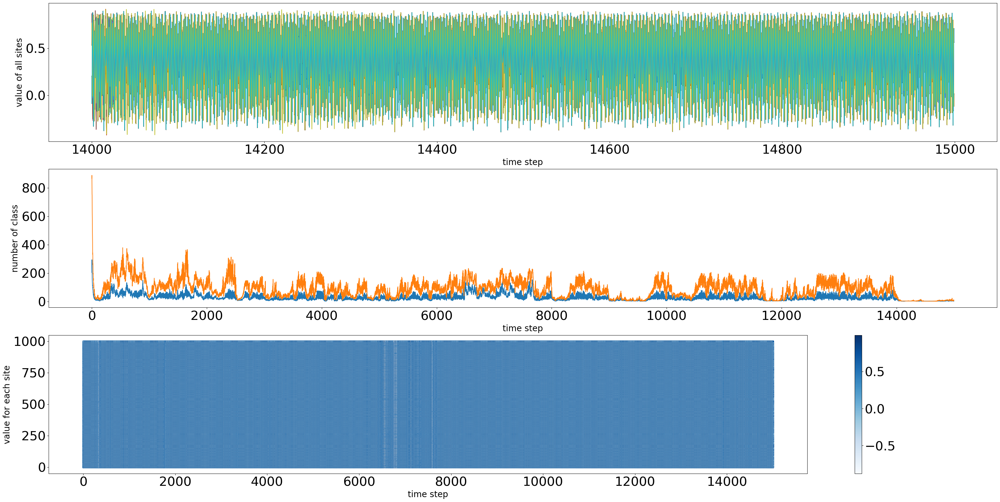

In [24]:
plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
#図の作成指示
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(3,1)

#１つ目の図
ax1[0].set_xlabel("time step",fontsize=20)
ax1[0].set_ylabel("value of all sites",fontsize=20)  
plot_len=1000
time=np.arange(nSteps)[-plot_len:]
ax1[0].plot(time, states[-plot_len:])

time=np.arange(nSteps)
#２つ目の図 p150参照, clustering
ax1[1].set_xlabel("time step", fontsize=20)
ax1[1].set_ylabel("number of class", fontsize=20)
ax1[1].plot(time, class_numsP1)
ax1[1].plot(time, class_numsP2)

#３つ目の図
ax1[2].set_xlabel("time step",fontsize=20)
ax1[2].set_ylabel("value for each site",fontsize=20)  

for i in range(L):
  bar=ax1[2].scatter(time, np.tile(i, time.size), s=8, c=states[:,i], cmap='Blues', marker=",")
fig.colorbar(bar)

# Display plot in window
plt.show() 

## diff with accuracy

時刻 n , 精度 P それぞれのクラスターがもつ値 の表示
ex: 1/P=2^(-18), 2^(-12)
p143, p149参照

精度指定を正しくしないと枝が消える??
消えることはないはずでは？
python は defoult 15 桁 ここでは20桁指定してる.

In [25]:
from __future__ import print_function, division
import numpy as np
import matplotlib.pyplot as plt

#精度が欲しい時の対応 decimal
from decimal import *
getcontext().prec = 22

L = 100     # no. of lattice sites
eps = 0.2   # diffusive coupling strength: 
r = 1.92     # control parameter r:
m_max=20

np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)

nTransients = 0   # The iterates we'll throw away
nSteps = 1000      # This sets how dense the bifurcation diagram will be

def logistic(a, x):
  return 1.0-(a*x)*x

def next_x(f, N, x):
    x_new = np.empty(x.shape)
    ave=(eps/float(N))*np.sum(list(map(f, np.tile(r, x.size), x)))
    x_new = (1-eps)*f(r, x) + ave #この行と前列の行の違いはmapを使うかどうかで生じる.
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

#t=Transients, icにおける値を使う.
values_eachsite=[]

for i in range(m_max):
  P=int(2**i)
  #clusteringP
  clustering_list = list( map(lambda x: Decimal(int(x*P))/Decimal(P), ic) )
  values_eachsite.append( list(set(clustering_list)) ) 

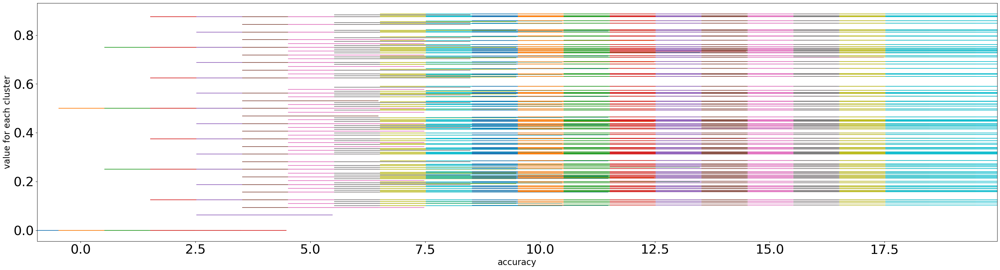

In [26]:
#values_eachsite=np.array(values_eachsite)
#check
#print(values_eachsite)
#print(len(values_eachsite))
plt.rcParams["figure.figsize"] = (40, 10)#(縦, 横)

#図の作成指示
fig=plt.figure()#(figsize=(100,100))
ax1=fig.add_subplot(1,1,1)

#横軸:精度, 縦軸:それぞれのクラスタでの正規化された値 
ax1.set_xlabel("accuracy",fontsize=20)
ax1.set_ylabel("value for each cluster",fontsize=20)  

for i in range(m_max):
  ax1.scatter( np.tile(i, len(values_eachsite[i])), np.array(values_eachsite[i]) , s=100000, marker="_")

# Display plot in window
plt.show() 

p158はおいとこう,縦軸:全部のsiteのvalue, 横軸:時間, それぞれの位置の色はクラスタ数を表示したい.
# series ??

In [27]:
from __future__ import print_function, division
import numpy as np
import matplotlib.pyplot as plt

L = 50      # no. of lattice sites
eps = 0.1   # diffusive coupling strength: 
r = 1.58     # control parameter r:
P1 = float(2**8) # accuracy
P2 = float(2**12)
"""
p143
時刻 n , 精度 P クラスター数 (k_n)^P の表示
ex: 1/P=2^(-18), 2^(-12)
p150参照
"""
np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)

nTransients = 1000   # The iterates we'll throw away
nSteps = 1000       # This sets how dense the bifurcation diagram will be

def logistic(a, x):
  return 1.0-(a*x)*x

def next_x(f, N, x):
    x_new = np.empty(x.shape)
    ave=(eps/float(N))*np.sum(list(map(f, np.tile(r, x.size), x)))
    x_new = (1-eps)*f(r, x) + ave #この行と前列の行の違いはmapを使うかどうかで生じる.
    return x_new

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
class_numsP1=[]
class_numsP2=[]
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])
  
  #clusteringP1
  clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[i])) 
  """以下で異なる値の数を取り出す. ユニークな値のみを抽出.
  https://note.nkmk.me/python-list-unique-duplicate/
  """
  num=len(list(set(clustering_list)) )
  class_numsP1.append(num)

  #clusteringP2
  clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[i])) 
  num=len(list(set(clustering_list)) )
  class_numsP2.append(num)

#最後だけ追加P1
clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP1.append(num)

#最後だけ追加P2
clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP2.append(num)

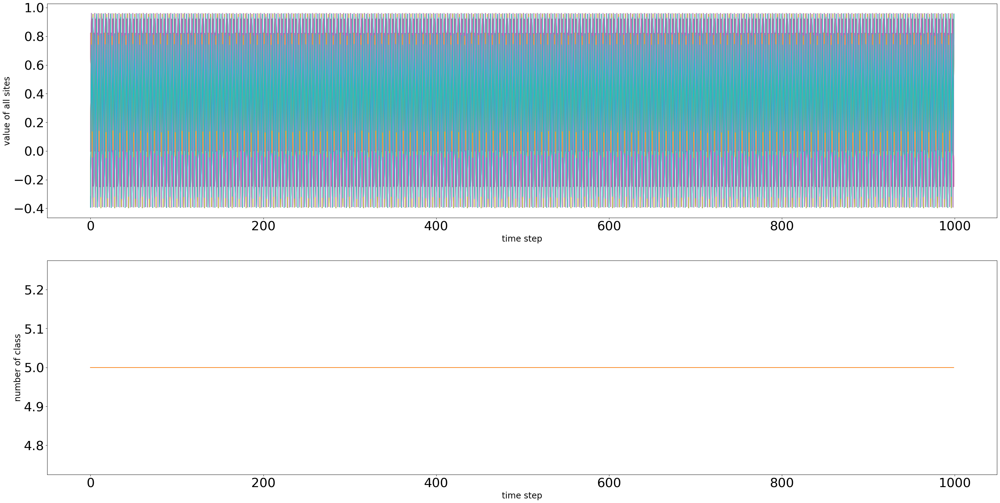

In [28]:
plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)

#図の作成指示
fig=plt.figure()#(figsize=(100,100))
ax1=fig.subplots(2,1)

#１つ目の図
ax1[0].set_xlabel("time step",fontsize=20)
ax1[0].set_ylabel("value of all sites",fontsize=20)  

time=np.arange(nSteps)
ax1[0].plot(time, states)

#２つ目の図 p150参照, clustering
ax1[1].set_xlabel("time step", fontsize=20)
ax1[1].set_ylabel("number of class", fontsize=20)
ax1[1].plot(time, class_numsP1)
ax1[1].plot(time, class_numsP2)

# Display plot in window
plt.show() 